In [1]:
# import PyQt6.QtCore
import os
os.environ["QT_API"] = "pyqt5"
import matplotlib.pyplot as plt
import mne
import numpy as np
import pandas as pd
from sklearn.model_selection import cross_val_score, KFold
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from mne.time_frequency import psd_array_multitaper
import os
from config import Config
configObj = Config()
configss = configObj.getConfigSnapshot()


mne.set_log_level(verbose='WARNING', return_old_level=False, add_frames=None)

# Assuming EEG data is in MNE format (Epochs or Raw). Placeholder for file path to participants' data
data_dir = "path_to_data"

# Frequency bands definitions
freq_bands = {'theta': (4, 8), 'alpha': (8, 12), 'beta': (12, 30)}

# Placeholder for results
results = []


In [2]:
# Function to calculate PSD for each epoch and frequency band
def calculate_psd_per_epoch(epochs, bands, sfreq):
    psds = []  # Store all PSDs per epoch
    freqs = None
    
    # Get PSD for each epoch
    for epoch in epochs.get_data():
        psd, freqs = mne.time_frequency.psd_array_multitaper(epoch, sfreq=sfreq, fmin=4., fmax=30., verbose=False)
        psds.append(psd)  # Append the PSD for the current epoch
    
    psds = np.array(psds)  # Convert to numpy array (n_epochs, n_channels, n_frequencies)
    
    band_powers = {band: [] for band in bands}  # Dictionary to store band powers
    
    # Calculate power in each frequency band for each epoch
    for band, (fmin, fmax) in bands.items():
        freq_mask = (freqs >= fmin) & (freqs <= fmax)  # Mask to select frequencies in the current band
        band_power = np.mean(psds[:, :, freq_mask], axis=-1)  # Average PSD over the selected frequencies
        band_powers[band] = band_power  # Store the band power for the current band (n_epochs, n_channels)
    
    return band_powers

In [3]:
import os
import mne

def load_participant_epochs(pnum, condition):
    """Load and concatenate epochs for a participant across multiple blocks for a given condition.
    
    Parameters:
    - pnum: Participant number (integer)
    - condition: Condition (e.g., 'D' or 'ND')
    
    Returns:
    - concatenated_epochs: Concatenated MNE epochs object for the participant
    """
    
    # Initialize an empty list to store the epochs from each block
    epochs_list = []
    
    # Loop through all 4 blocks
    for b_cnt in range(0, 4):
        # Create the block numbers by appending the current block count to the condition
        block_num = f"{condition}{b_cnt}"
        
        # Construct the participant's folder name
        participant_number = 'P' + str(pnum)
        # Create the full path to the epochs file
        participant_data_path = participant_number + '/' + block_num + '-epo.fif'
        path = os.path.join(configss['root'], configss['data_dir'], participant_data_path)
        
        # Load the epochs file for this block
        epochs = mne.read_epochs(path, preload=True)
        
        # Append the loaded epochs to the list
        epochs_list.append(epochs)
    
    # Concatenate all the loaded epochs from the list
    concatenated_epochs = mne.concatenate_epochs(epochs_list)
    
    return concatenated_epochs


In [4]:
import numpy as np
from scipy.stats import shapiro, ttest_rel, wilcoxon
import mne
from mne.time_frequency import psd_array_multitaper

# Define frequency bands (theta and alpha)
freq_bands = {
    'theta': (4, 8),
    'alpha': (8, 12)
}

# Initialize dictionaries to store task load indices
task_load_index_D = {}
task_load_index_ND = {}

# Define valid participant IDs (excluding specified IDs)
valid_pids = [el for el in range(1, 32) if el not in [5, 13, 14, 16, 17, 20, 31]]

# Set channel names for task load index calculation
frontal_channel = '2Z'
parietal_channel = '7Z'

# Set random seed for reproducibility
np.random.seed(42)

def match_epoch_counts(epochs1, epochs2):
    """
    Randomly removes epochs from the condition with more epochs to match the number of epochs.
    
    Parameters:
        epochs1 (mne.Epochs): First condition epochs.
        epochs2 (mne.Epochs): Second condition epochs.
    
    Returns:
        Tuple of Epochs objects with matched number of epochs.
    """
    n_epochs1 = len(epochs1)
    n_epochs2 = len(epochs2)
    
    if n_epochs1 == n_epochs2:
        return epochs1, epochs2  # No action needed
    
    # Determine which condition has more epochs
    if n_epochs1 > n_epochs2:
        # Randomly select epochs to keep from epochs1
        selected_indices = np.random.choice(n_epochs1, n_epochs2, replace=False)
        epochs1_matched = epochs1[selected_indices]
        epochs2_matched = epochs2
    else:
        # Randomly select epochs to keep from epochs2
        selected_indices = np.random.choice(n_epochs2, n_epochs1, replace=False)
        epochs2_matched = epochs2[selected_indices]
        epochs1_matched = epochs1
    
    return epochs1_matched, epochs2_matched

def calculate_psd(epochs, channel_name, fmin, fmax):
    """
    Calculate the power spectral density for a specific channel and frequency band.
    
    Parameters:
        epochs (mne.Epochs): The epochs data.
        channel_name (str): Name of the channel to extract.
        fmin (float): Minimum frequency of the band.
        fmax (float): Maximum frequency of the band.
        
    Returns:
        np.ndarray: PSD values for each epoch in the specified frequency band.
    """
    # Get the index of the specified channel
    channel_idx = epochs.ch_names.index(channel_name)
    
    # Extract data for the specific channel (shape: n_epochs, n_times)
    data = epochs.get_data()[:, channel_idx, :]
    
    # Calculate the PSD using multitaper method
    psd, freqs = psd_array_multitaper(data, sfreq=epochs.info['sfreq'], fmin=fmin, fmax=fmax, verbose=False)
    
    # Average the PSD within the frequency band
    band_power = np.mean(psd, axis=1)  # Shape: (n_epochs,)
    
    return band_power

def calculate_task_load_index(epochs):
    """
    Calculate task load index for each epoch using the ratio of frontal theta power to parietal alpha power.
    
    Parameters:
        epochs (mne.Epochs): The epochs data.
        
    Returns:
        np.ndarray: Task load index for each epoch (n_epochs,).
    """
    # Calculate theta power at the frontal channel
    theta_power = calculate_psd(epochs, frontal_channel, freq_bands['theta'][0], freq_bands['theta'][1])
    
    # Calculate alpha power at the parietal channel
    alpha_power = calculate_psd(epochs, parietal_channel, freq_bands['alpha'][0], freq_bands['alpha'][1])
    
    # Calculate task load index
    task_load_index = theta_power / alpha_power
    
    return task_load_index  # Shape: (n_epochs,)

# Load and compute task load indices for all participants
for participant_id in valid_pids:
    print(f"Processing Participant {participant_id}...")
    try:
        # Load epochs for both conditions
        epochs_condition1 = load_participant_epochs(participant_id, 'D')
        epochs_condition2 = load_participant_epochs(participant_id, 'ND')
        
        # Match the number of epochs between conditions by randomly removing excess epochs
        epochs_condition1_matched, epochs_condition2_matched = match_epoch_counts(epochs_condition1, epochs_condition2)
        print(f"  Condition 'D' epochs: {len(epochs_condition1_matched)}")
        print(f"  Condition 'ND' epochs: {len(epochs_condition2_matched)}")
        
        # Calculate Task Load Index for each condition
        task_load_index_D_epochs = calculate_task_load_index(epochs_condition1_matched)
        task_load_index_ND_epochs = calculate_task_load_index(epochs_condition2_matched)
        
        # Store per-epoch task load indices
        task_load_index_D[participant_id] = task_load_index_D_epochs
        task_load_index_ND[participant_id] = task_load_index_ND_epochs
    except Exception as e:
        print(f"  Error processing Participant {participant_id}: {e}")


Processing Participant 1...


C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 409
  Condition 'ND' epochs: 409
Processing Participant 2...


C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 400
  Condition 'ND' epochs: 400
Processing Participant 3...


C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 328
  Condition 'ND' epochs: 328
Processing Participant 4...


C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 365
  Condition 'ND' epochs: 365
Processing Participant 6...


C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 377
  Condition 'ND' epochs: 377
Processing Participant 7...


C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 344
  Condition 'ND' epochs: 344
Processing Participant 8...


C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 417
  Condition 'ND' epochs: 417
Processing Participant 9...


C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 441
  Condition 'ND' epochs: 441
Processing Participant 10...


C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 236
  Condition 'ND' epochs: 236
Processing Participant 11...


C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 244
  Condition 'ND' epochs: 244
Processing Participant 12...


C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 433
  Condition 'ND' epochs: 433
Processing Participant 15...


C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 238
  Condition 'ND' epochs: 238
Processing Participant 18...


C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 397
  Condition 'ND' epochs: 397
Processing Participant 19...


C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 437
  Condition 'ND' epochs: 437
Processing Participant 21...


C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 443
  Condition 'ND' epochs: 443
Processing Participant 22...


C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 440
  Condition 'ND' epochs: 440
Processing Participant 23...


C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 411
  Condition 'ND' epochs: 411
Processing Participant 24...


C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 314
  Condition 'ND' epochs: 314
Processing Participant 25...


C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 273
  Condition 'ND' epochs: 273
Processing Participant 26...


C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 324
  Condition 'ND' epochs: 324
Processing Participant 27...


C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 303
  Condition 'ND' epochs: 303
Processing Participant 28...


C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 399
  Condition 'ND' epochs: 399
Processing Participant 29...


C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 318
  Condition 'ND' epochs: 318
Processing Participant 30...


C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_2932\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 412
  Condition 'ND' epochs: 412


In [5]:
task_load_index_D

{1: array([3.53840865, 3.15645296, 2.63130416, 3.00551242, 1.72813961,
        2.58835179, 2.29487017, 2.72560096, 4.11462363, 3.8517811 ,
        2.45309318, 4.69432217, 3.17223577, 4.18276424, 2.41516405,
        4.47074666, 2.49699555, 1.76372494, 3.11548127, 3.83566095,
        7.31295054, 5.32570917, 2.26125684, 2.06050988, 1.89638438,
        3.01283488, 5.23208583, 1.84892658, 2.54184216, 1.82348197,
        2.71509183, 2.09199308, 3.83563462, 4.23011457, 1.17127029,
        3.30502031, 1.8929534 , 2.90404326, 3.00272613, 1.88723115,
        3.03476334, 1.9091513 , 5.31850452, 2.05764484, 3.1324287 ,
        3.69023571, 2.17366656, 3.4889415 , 2.30463974, 2.54159989,
        2.11812098, 2.18884695, 2.14678889, 1.33809012, 2.02214529,
        2.35849475, 3.67245142, 2.29075689, 6.8365151 , 4.05317971,
        1.58566657, 1.52726212, 2.12052289, 4.65425327, 1.90668387,
        3.48180229, 2.32886634, 3.01549665, 1.38536378, 4.06408595,
        0.65561825, 1.54178864, 1.85032633, 1

In [6]:
import numpy as np
from scipy.stats import shapiro, ttest_rel, wilcoxon

# Initialize lists to store TLI values for all participants for each condition
tli_values_D = []
tli_values_ND = []

# Collect average TLI values for all participants
for participant_id in valid_pids:
    try:
        # Calculate the mean TLI for each participant in both conditions
        tli_mean_D = np.mean(task_load_index_D[participant_id])
        tli_mean_ND = np.mean(task_load_index_ND[participant_id])
        
        # Append to the lists
        tli_values_D.append(tli_mean_D)
        tli_values_ND.append(tli_mean_ND)
    except Exception as e:
        print(f"Error processing Participant {participant_id}: {e}")

# Convert lists to numpy arrays
tli_values_D = np.array(tli_values_D)
tli_values_ND = np.array(tli_values_ND)

# Calculate overall mean and standard deviation for each condition
mean_tli_D = np.mean(tli_values_D)
std_tli_D = np.std(tli_values_D)
mean_tli_ND = np.mean(tli_values_ND)
std_tli_ND = np.std(tli_values_ND)

# Print average TLI values and standard deviations
print(f"Condition D: Mean TLI = {mean_tli_D:.4f}, Std = {std_tli_D:.4f}")
print(f"Condition ND: Mean TLI = {mean_tli_ND:.4f}, Std = {std_tli_ND:.4f}")

# Check normality using Shapiro-Wilk test
shapiro_D_stat, shapiro_D_p = shapiro(tli_values_D)
shapiro_ND_stat, shapiro_ND_p = shapiro(tli_values_ND)

print(f"Shapiro-Wilk Test for Condition D: Statistic = {shapiro_D_stat:.4f}, p-value = {shapiro_D_p:.4f}")
print(f"Shapiro-Wilk Test for Condition ND: Statistic = {shapiro_ND_stat:.4f}, p-value = {shapiro_ND_p:.4f}")

# Determine which test to use based on normality results
if shapiro_D_p > 0.05 and shapiro_ND_p > 0.05:
    # Both sets are normally distributed; use paired t-test
    t_stat, t_p_value = ttest_rel(tli_values_D, tli_values_ND)
    print(f"Paired t-test: t-statistic = {t_stat:.4f}, p-value = {t_p_value:.4f}")
else:
    # Not normally distributed; use Wilcoxon signed-rank test
    wilcoxon_stat, wilcoxon_p_value = wilcoxon(tli_values_D, tli_values_ND)
    print(f"Wilcoxon signed-rank test: Statistic = {wilcoxon_stat:.4f}, p-value = {wilcoxon_p_value:.4f}")


Condition D: Mean TLI = 2.2840, Std = 1.1322
Condition ND: Mean TLI = 2.1757, Std = 1.0596
Shapiro-Wilk Test for Condition D: Statistic = 0.7742, p-value = 0.0001
Shapiro-Wilk Test for Condition ND: Statistic = 0.8194, p-value = 0.0006
Wilcoxon signed-rank test: Statistic = 78.0000, p-value = 0.0395


In [14]:
import numpy as np
from scipy.stats import shapiro, ttest_rel, wilcoxon

def remove_outliers(data):
    """
    Removes outliers from a list of data using the IQR method.
    
    Parameters:
        data (list or np.ndarray): The data from which to remove outliers.
        
    Returns:
        np.ndarray: The data with outliers removed.
    """
    # Calculate Q1, Q3, and IQR
    Q1 = np.percentile(data, 25)
    Q3 = np.percentile(data, 75)
    IQR = Q3 - Q1

    # Determine outlier boundaries
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Filter out outliers
    return np.array([x for x in data if lower_bound <= x <= upper_bound])

# Initialize lists to store TLI values for all participants for each condition
tli_values_D = []
tli_values_ND = []

# Collect average TLI values for all participants, removing outliers first
for participant_id in valid_pids:
    try:
        # Remove outliers for each participant's TLI values
        tli_D_clean = remove_outliers(task_load_index_D[participant_id])
        tli_ND_clean = remove_outliers(task_load_index_ND[participant_id])
        
        # Calculate the mean TLI for each participant in both conditions
        tli_mean_D = np.mean(tli_D_clean) if len(tli_D_clean) > 0 else np.nan
        tli_mean_ND = np.mean(tli_ND_clean) if len(tli_ND_clean) > 0 else np.nan
        
        # Append to the lists
        if not np.isnan(tli_mean_D):
            tli_values_D.append(tli_mean_D)
        if not np.isnan(tli_mean_ND):
            tli_values_ND.append(tli_mean_ND)
    except Exception as e:
        print(f"Error processing Participant {participant_id}: {e}")

# Convert lists to numpy arrays
tli_values_D = np.array(tli_values_D)
tli_values_ND = np.array(tli_values_ND)

# Calculate overall mean and standard deviation for each condition
mean_tli_D = np.mean(tli_values_D)
std_tli_D = np.std(tli_values_D)
mean_tli_ND = np.mean(tli_values_ND)
std_tli_ND = np.std(tli_values_ND)

# Print average TLI values and standard deviations
print(f"Condition D: Mean TLI = {mean_tli_D:.4f}, Std = {std_tli_D:.4f}")
print(f"Condition ND: Mean TLI = {mean_tli_ND:.4f}, Std = {std_tli_ND:.4f}")

# Check normality using Shapiro-Wilk test
shapiro_D_stat, shapiro_D_p = shapiro(tli_values_D)
shapiro_ND_stat, shapiro_ND_p = shapiro(tli_values_ND)

print(f"Shapiro-Wilk Test for Condition D: Statistic = {shapiro_D_stat:.4f}, p-value = {shapiro_D_p:.4f}")
print(f"Shapiro-Wilk Test for Condition ND: Statistic = {shapiro_ND_stat:.4f}, p-value = {shapiro_ND_p:.4f}")

# Determine which test to use based on normality results
if shapiro_D_p > 0.05 and shapiro_ND_p > 0.05:
    # Both sets are normally distributed; use paired t-test
    t_stat, t_p_value = ttest_rel(tli_values_D, tli_values_ND)
    print(f"Paired t-test: t-statistic = {t_stat:.4f}, p-value = {t_p_value:.4f}")
else:
    # Not normally distributed; use Wilcoxon signed-rank test
    wilcoxon_stat, wilcoxon_p_value = wilcoxon(tli_values_D, tli_values_ND)
    print(f"Wilcoxon signed-rank test: Statistic = {wilcoxon_stat:.4f}, p-value = {wilcoxon_p_value:.4f}")


Condition D: Mean TLI = 2.0876, Std = 1.0508
Condition ND: Mean TLI = 1.9882, Std = 0.9913
Shapiro-Wilk Test for Condition D: Statistic = 0.7705, p-value = 0.0001
Shapiro-Wilk Test for Condition ND: Statistic = 0.8125, p-value = 0.0005
Wilcoxon signed-rank test: Statistic = 77.0000, p-value = 0.0366


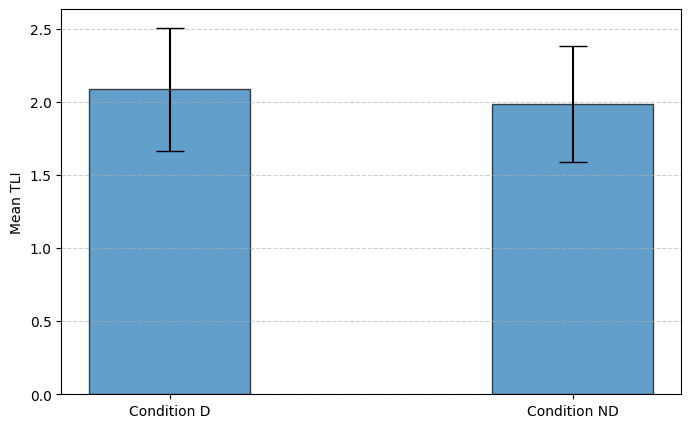

In [21]:
import numpy as np
import matplotlib.pyplot as plt

# # Sample data to simulate the means and confidence intervals
# mean_tli_D = 5.4  # Example mean for Condition D
# std_tli_D = 1.2   # Example standard deviation for Condition D
# mean_tli_ND = 4.8  # Example mean for Condition ND
# std_tli_ND = 1.0   # Example standard deviation for Condition ND

# Number of participants
n = 24

# Calculate the standard error for each condition
se_tli_D = std_tli_D / np.sqrt(n)
se_tli_ND = std_tli_ND / np.sqrt(n)

# 95% Confidence Interval (CI) calculation (assuming a normal distribution)
ci_95_tli_D = 1.96 * se_tli_D
ci_95_tli_ND = 1.96 * se_tli_ND

# Prepare data for plotting
conditions = ['Condition D', 'Condition ND']
means = [mean_tli_D, mean_tli_ND]
ci_95 = [ci_95_tli_D, ci_95_tli_ND]

# Plotting
plt.figure(figsize=(8, 5))
plt.bar(conditions, means, yerr=ci_95, capsize=10, width=0.4, edgecolor='black', alpha=0.7)
plt.ylabel('Mean TLI')
# plt.title('Mean TLI for Each Condition with 95% Confidence Intervals')
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.show()


In [17]:
# Calculate effect size for Wilcoxon (rank-biserial correlation)
n = len(tli_values_D)
rank_biserial = wilcoxon_stat / (n * (n + 1) / 2)
print(f"Rank-biserial correlation (effect size) = {rank_biserial:.4f}")

Rank-biserial correlation (effect size) = 0.2567


Cohen's d: 0.2631


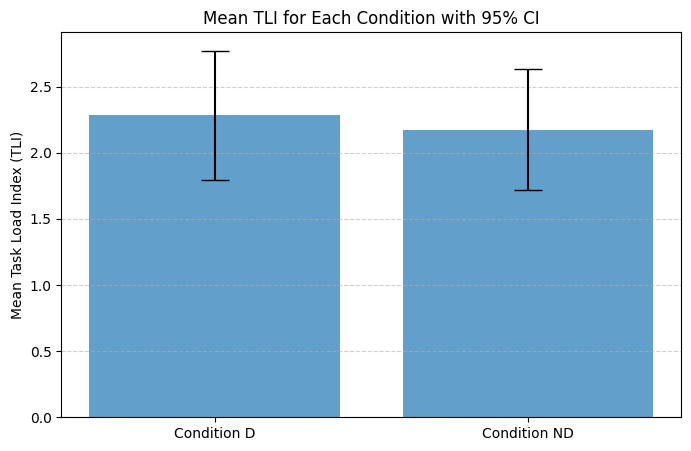

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ttest_rel, sem, t

# Calculate means and standard deviations for each participant
tli_diff = np.array([np.mean(task_load_index_D[pid]) - np.mean(task_load_index_ND[pid]) for pid in valid_pids])
mean_diff = np.mean(tli_diff)
std_diff = np.std(tli_diff, ddof=1)

# Calculate Cohen's d for paired samples
cohens_d = mean_diff / std_diff
print(f"Cohen's d: {cohens_d:.4f}")

# Calculate mean and SEM for each condition
tli_mean_D = np.mean([np.mean(task_load_index_D[pid]) for pid in valid_pids])
tli_sem_D = sem([np.mean(task_load_index_D[pid]) for pid in valid_pids])

tli_mean_ND = np.mean([np.mean(task_load_index_ND[pid]) for pid in valid_pids])
tli_sem_ND = sem([np.mean(task_load_index_ND[pid]) for pid in valid_pids])

# Calculate the 95% confidence intervals
confidence_level = 0.95
degrees_freedom = len(valid_pids) - 1
critical_value = t.ppf((1 + confidence_level) / 2, degrees_freedom)

ci_D = critical_value * tli_sem_D
ci_ND = critical_value * tli_sem_ND

# Plot the mean TLI for each condition with confidence intervals
conditions = ['Condition D', 'Condition ND']
means = [tli_mean_D, tli_mean_ND]
cis = [ci_D, ci_ND]

plt.figure(figsize=(8, 5))
plt.bar(conditions, means, yerr=cis, capsize=10, alpha=0.7)
plt.ylabel('Mean Task Load Index (TLI)')
plt.title('Mean TLI for Each Condition with 95% CI')
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.show()


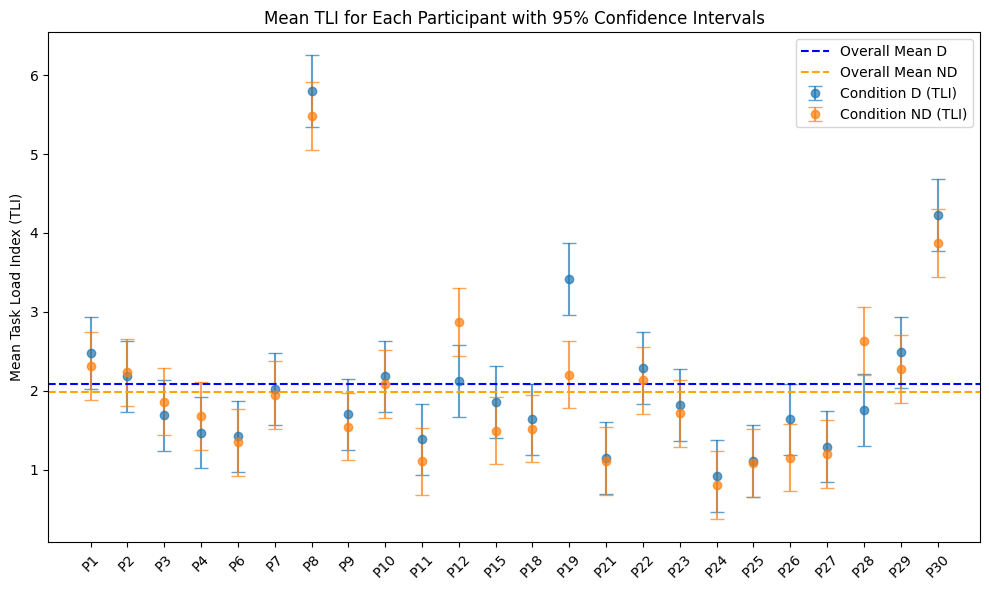

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sem, t

# Function to remove outliers using IQR
def remove_outliers(data):
    Q1 = np.percentile(data, 25)
    Q3 = np.percentile(data, 75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return np.array([x for x in data if lower_bound <= x <= upper_bound])

# Sample data representing TLI values for participants (Replace this with actual data)
np.random.seed(42)
#valid_pids = [1, 2, 3, 4, 6, 7, 8, 9, 10, 11, 12, 15, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]
#task_load_index_D = {pid: np.random.normal(0.8, 0.2, 100) for pid in valid_pids}
#task_load_index_ND = {pid: np.random.normal(0.75, 0.2, 100) for pid in valid_pids}

# Initialize lists to store TLI values for all participants for each condition
tli_values_D = []
tli_values_ND = []

# Collect average TLI values for all participants, removing outliers first
for participant_id in valid_pids:
    try:
        # Remove outliers for each participant's TLI values
        tli_D_clean = remove_outliers(task_load_index_D[participant_id])
        tli_ND_clean = remove_outliers(task_load_index_ND[participant_id])
        
        # Calculate the mean TLI for each participant in both conditions
        tli_mean_D = np.mean(tli_D_clean) if len(tli_D_clean) > 0 else np.nan
        tli_mean_ND = np.mean(tli_ND_clean) if len(tli_ND_clean) > 0 else np.nan
        
        # Append to the lists
        if not np.isnan(tli_mean_D):
            tli_values_D.append(tli_mean_D)
        if not np.isnan(tli_mean_ND):
            tli_values_ND.append(tli_mean_ND)
    except Exception as e:
        print(f"Error processing Participant {participant_id}: {e}")

# Convert lists to numpy arrays
tli_values_D = np.array(tli_values_D)
tli_values_ND = np.array(tli_values_ND)

# Calculate overall mean and 95% confidence intervals for each condition
mean_tli_D = np.mean(tli_values_D)
sem_tli_D = sem(tli_values_D)
ci_D = sem_tli_D * t.ppf(0.975, len(tli_values_D) - 1)

mean_tli_ND = np.mean(tli_values_ND)
sem_tli_ND = sem(tli_values_ND)
ci_ND = sem_tli_ND * t.ppf(0.975, len(tli_values_ND) - 1)

# Plot individual participant means with 95% confidence intervals
plt.figure(figsize=(10, 6))
x = np.arange(len(valid_pids))

plt.errorbar(x, tli_values_D, yerr=ci_D, fmt='o', capsize=5, label='Condition D (TLI)', alpha=0.7)
plt.errorbar(x, tli_values_ND, yerr=ci_ND, fmt='o', capsize=5, label='Condition ND (TLI)', alpha=0.7)

# Plot overall mean dashed lines
plt.axhline(mean_tli_D, color='blue', linestyle='--', linewidth=1.5, label='Overall Mean D')
plt.axhline(mean_tli_ND, color='orange', linestyle='--', linewidth=1.5, label='Overall Mean ND')

# Labels and legend
plt.xticks(x, [f'P{pid}' for pid in valid_pids], rotation=45)
plt.ylabel('Mean Task Load Index (TLI)')
plt.title('Mean TLI for Each Participant with 95% Confidence Intervals')
plt.legend()
plt.tight_layout()
plt.show()


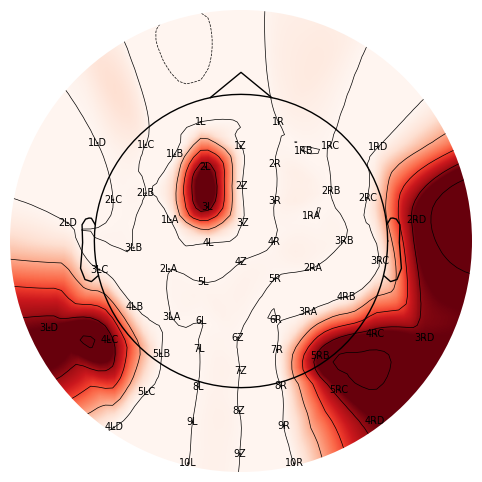

Significant channels for Participant 1 saved to engagement_index_significant_channels_participants.csv


In [6]:
# Statistical Testing for Participant 1
participant_of_interest = 1

# Retrieve engagement indices for Participant 1
eng_D_epochs = engagement_index_D.get(participant_of_interest)
eng_ND_epochs = engagement_index_ND.get(participant_of_interest)

if eng_D_epochs is None or eng_ND_epochs is None:
    raise ValueError(f"Engagement indices for Participant {participant_of_interest} not found.")

# Ensure that both conditions have the same number of epochs
if eng_D_epochs.shape != eng_ND_epochs.shape:
    raise ValueError("Mismatch in number of epochs between conditions after matching.")

# Perform paired t-test for each channel across epochs
t_stats, p_values = ttest_rel(eng_D_epochs, eng_ND_epochs, axis=0)

# Multiple comparison correction using False Discovery Rate (FDR)
reject, p_values_corrected, _, _ = multipletests(p_values, alpha=0.05, method='fdr_bh')

# Identify significant channels (where reject is True)
significant_channels = np.where(reject)[0]  # Indices of significant channels

# Get channel names from the epochs
channel_names = epochs_condition1_matched.info['ch_names']  # Assuming epochs have channel names

# Retrieve significant channel names
significant_channel_names = [channel_names[i] for i in significant_channels]

# Plotting Significant Channels on Topographical Map Using Epochs' Montage
# Extract the info object from the matched epochs
info = epochs_condition1_matched.info

# Ensure the montage is set in the epochs
if info.get_montage() is None:
    raise ValueError("Montage information is missing from the epochs.")

# Create data for topomap: 1 for significant, 0 otherwise
sig_data = np.zeros(len(channel_names))
sig_data[significant_channels] = 1  # Mark significant channels

# Create an Evoked object (required for plotting)
# The data shape should be (n_channels, n_times). We'll set n_times=1
evoked = mne.EvokedArray(sig_data[:, np.newaxis], info)

# Plot topomap
fig, ax = plt.subplots(figsize=(8, 6))
mne.viz.plot_topomap(
    sig_data,
    evoked.info,
    axes=ax,
    show=True,
    names=np.array(channel_names),
    cmap='Reds',
    vlim = (0,1),
    sensors=True,
    outlines='head',
    # title=f'Participant {participant_of_interest} - Significant Channels'
)
plt.show()

# Saving Significant Channels to CSV
data = {
    'Participant_ID': [participant_of_interest],
    'Significant_Channels': [', '.join(significant_channel_names)]
}

df = pd.DataFrame(data)
csv_filename = f'engagement_index_significant_channels_participants.csv'
df.to_csv(csv_filename, index=False)

print(f"Significant channels for Participant {participant_of_interest} saved to {csv_filename}")

In [50]:
import numpy as np
import pandas as pd
from scipy.stats import wilcoxon
from statsmodels.stats.multitest import multipletests
import mne
import matplotlib.pyplot as plt

# Define frequency bands (example: theta, alpha, beta)
freq_bands = {
    'theta': (4, 8),
    'alpha': (8, 12),
    'beta': (12, 30)
}

# Initialize dictionaries to store engagement indices
engagement_index_D = {}
engagement_index_ND = {}

# Define valid participant IDs (excluding specified IDs)
valid_pids = [el for el in range(1, 32) if el not in [5, 13, 14, 16, 17, 20, 31]]

# Set random seed for reproducibility
np.random.seed(42)

def match_epoch_counts(epochs1, epochs2):
    """
    Randomly removes epochs from the condition with more epochs to match the number of epochs.
    """
    n_epochs1 = len(epochs1)
    n_epochs2 = len(epochs2)
    
    if n_epochs1 == n_epochs2:
        return epochs1, epochs2
    
    if n_epochs1 > n_epochs2:
        selected_indices = np.random.choice(n_epochs1, n_epochs2, replace=False)
        epochs1_matched = epochs1[selected_indices]
        epochs2_matched = epochs2
    else:
        selected_indices = np.random.choice(n_epochs2, n_epochs1, replace=False)
        epochs2_matched = epochs2[selected_indices]
        epochs1_matched = epochs1
    
    return epochs1_matched, epochs2_matched

# Load and compute engagement indices for all participants
for participant_id in valid_pids:
    print(f"Processing Participant {participant_id}...")
    try:
        # Load epochs for both conditions
        epochs_condition1 = load_participant_epochs(participant_id, 'D')
        epochs_condition2 = load_participant_epochs(participant_id, 'ND')
        
        # Match the number of epochs between conditions
        epochs_condition1_matched, epochs_condition2_matched = match_epoch_counts(epochs_condition1, epochs_condition2)
        print(f"  Condition 'D' epochs: {len(epochs_condition1_matched)}")
        print(f"  Condition 'ND' epochs: {len(epochs_condition2_matched)}")
        
        # Calculate Power Spectral Density (PSD) for each condition
        power_bands_D = calculate_psd_per_epoch(epochs_condition1_matched, freq_bands, epochs_condition1_matched.info['sfreq'])
        power_bands_ND = calculate_psd_per_epoch(epochs_condition2_matched, freq_bands, epochs_condition2_matched.info['sfreq'])
        
        # Calculate Engagement Index for each condition
        engagement_index_D_epochs = calculate_engagement_index(power_bands_D)
        engagement_index_ND_epochs = calculate_engagement_index(power_bands_ND)
        
        # Store per-epoch engagement indices
        engagement_index_D[participant_id] = engagement_index_D_epochs
        engagement_index_ND[participant_id] = engagement_index_ND_epochs
    except Exception as e:
        print(f"  Error processing Participant {participant_id}: {e}")

# Initialize list to store results for all participants
results = []

# Iterate through all participants to perform statistical testing
for participant_id in valid_pids:
    print(f"Performing statistical testing for Participant {participant_id}...")
    eng_D_epochs = engagement_index_D.get(participant_id)
    eng_ND_epochs = engagement_index_ND.get(participant_id)
    
    if eng_D_epochs is None or eng_ND_epochs is None:
        print(f"  Skipping Participant {participant_id}: Engagement indices not found.")
        continue
    
    if eng_D_epochs.shape != eng_ND_epochs.shape:
        print(f"  Skipping Participant {participant_id}: Mismatch in number of epochs after matching.")
        continue
    
    # Perform Wilcoxon test for each channel across epochs
    p_values = []
    for ch in range(eng_D_epochs.shape[1]):  # Iterate over channels
        try:
            stat, p = wilcoxon(eng_D_epochs[:, ch], eng_ND_epochs[:, ch])
            p_values.append(p)
        except ValueError as e:
            p_values.append(1.0)  # If test fails (e.g., due to lack of variance), assign p-value of 1
    
    # Multiple comparison correction using False Discovery Rate (FDR)
    reject, p_values_corrected, _, _ = multipletests(p_values, alpha=0.05, method='fdr_bh')
    
    # Identify significant channels (where reject is True)
    significant_channels = np.where(reject)[0]  # Indices of significant channels
    
    # Get channel names from the matched epochs
    channel_names = epochs_condition1_matched.info['ch_names']
    
    # Retrieve significant channel names
    significant_channel_names = [channel_names[i] for i in significant_channels]
    
    # Sort the channel names to ensure consistent ordering
    significant_channel_names_sorted = sorted(significant_channel_names)
    
    # Append results for CSV
    results.append({
        'Participant_ID': participant_id,
        'Significant_Channels': ', '.join(significant_channel_names_sorted)
    })

# Create DataFrame and save to CSV
df_results = pd.DataFrame(results)
csv_filename = 'engagement_index_significant_channels_participants_wilcoxon.csv'
df_results.to_csv(csv_filename, index=False)

print(f"Significant channels for all participants saved to {csv_filename}")

# # Determine the number of participants with results
# num_participants = len(results)
# print(f"Total Participants with Results: {num_participants}")

# if num_participants == 0:
#     print("No participants with significant channels to plot.")
# else:
#     # Define the number of rows and columns for subplots
#     num_rows = 4
#     num_cols = int(np.ceil(num_participants / num_rows))
    
#     # Create a figure with subplots
#     fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows))
#     axes = axes.flatten()
    
#     # Iterate through each participant and plot the topomap
#     for idx, row in df_results.iterrows():
#         participant_id = row['Participant_ID']
#         sig_channels = row['Significant_Channels'].split(', ') if row['Significant_Channels'] else []
        
#         ax = axes[idx]
        
#         # Create data for topomap: 1 for significant, 0 otherwise
#         sig_data = np.zeros(len(channel_names))
#         for ch in sig_channels:
#             if ch in channel_names:
#                 ch_idx = channel_names.index(ch)
#                 sig_data[ch_idx] = 1  # Mark significant channels
        
#         # Create an Evoked object (required for plotting)
#         evoked = mne.EvokedArray(sig_data[:, np.newaxis], epochs_condition1_matched.info)
        
#         # Plot topomap
#         mne.viz.plot_topomap(
#             sig_data,
#             evoked.info,
#             axes=ax,
#             show=True,
#             cmap='Reds',
#             vlim=(0,1),
#             sensors=True,
#             outlines='head',
#             contours=0,
#             sphere=(0.00, -0.02, 0.00, 0.13)
#         )
        
#         ax.set_xticks([])
#         ax.set_yticks([])
#         ax.set_aspect('equal')
    
#     # Remove any unused subplots
#     for j in range(num_participants, len(axes)):
#         fig.delaxes(axes[j])
    
#     plt.tight_layout()
#     plt.show()


Processing Participant 1...


C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 409
  Condition 'ND' epochs: 409
Processing Participant 2...


C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 400
  Condition 'ND' epochs: 400
Processing Participant 3...


C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 328
  Condition 'ND' epochs: 328
Processing Participant 4...


C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 365
  Condition 'ND' epochs: 365
Processing Participant 6...


C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 377
  Condition 'ND' epochs: 377
Processing Participant 7...


C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 344
  Condition 'ND' epochs: 344
Processing Participant 8...


C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 417
  Condition 'ND' epochs: 417
Processing Participant 9...


C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 441
  Condition 'ND' epochs: 441
Processing Participant 10...
  Condition 'D' epochs: 236
  Condition 'ND' epochs: 236


C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


Processing Participant 11...
  Condition 'D' epochs: 244
  Condition 'ND' epochs: 244


C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


Processing Participant 12...


C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 433
  Condition 'ND' epochs: 433
Processing Participant 15...
  Condition 'D' epochs: 238
  Condition 'ND' epochs: 238


C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


Processing Participant 18...


C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 397
  Condition 'ND' epochs: 397
Processing Participant 19...


C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 437
  Condition 'ND' epochs: 437
Processing Participant 21...


C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 443
  Condition 'ND' epochs: 443
Processing Participant 22...


C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 440
  Condition 'ND' epochs: 440
Processing Participant 23...


C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 411
  Condition 'ND' epochs: 411
Processing Participant 24...


C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 314
  Condition 'ND' epochs: 314
Processing Participant 25...
  Condition 'D' epochs: 273
  Condition 'ND' epochs: 273


C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


Processing Participant 26...


C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 324
  Condition 'ND' epochs: 324
Processing Participant 27...


C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 303
  Condition 'ND' epochs: 303
Processing Participant 28...


C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 399
  Condition 'ND' epochs: 399
Processing Participant 29...
  Condition 'D' epochs: 318
  Condition 'ND' epochs: 318


C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


Processing Participant 30...


C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)


  Condition 'D' epochs: 412
  Condition 'ND' epochs: 412
Performing statistical testing for Participant 1...
Performing statistical testing for Participant 2...
Performing statistical testing for Participant 3...
Performing statistical testing for Participant 4...
Performing statistical testing for Participant 6...
Performing statistical testing for Participant 7...
Performing statistical testing for Participant 8...
Performing statistical testing for Participant 9...
Performing statistical testing for Participant 10...
Performing statistical testing for Participant 11...
Performing statistical testing for Participant 12...
Performing statistical testing for Participant 15...
Performing statistical testing for Participant 18...
Performing statistical testing for Participant 19...
Performing statistical testing for Participant 21...
Performing statistical testing for Participant 22...
Performing statistical testing for Participant 23...
Performing statistical testing for Participant 24.

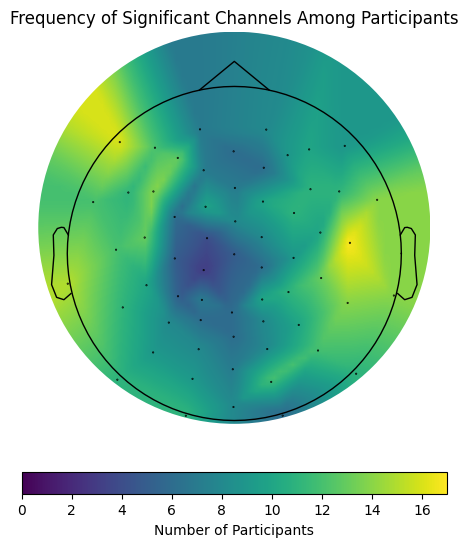

In [38]:
# Assuming 'df_results' and 'channel_names' are already defined
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import mne
from matplotlib.colors import ListedColormap
import numpy.ma as ma


df_results = pd.DataFrame(results)
# Initialize channel counts
channel_counts = {ch: 0 for ch in channel_names}

# Iterate through each participant's significant channels
for idx, row in df_results.iterrows():
    sig_channels = row['Significant_Channels'].split(', ') if row['Significant_Channels'] else []
    for ch in sig_channels:
        if ch in channel_counts:
            channel_counts[ch] += 1

# Define thresholds
low_threshold = 5      # Minimum occurrence to be considered
medium_threshold = 8   # Adjust as needed
high_threshold = 16    # Adjust as needed (e.g., two-thirds of participants)

# Create data for topomap
sig_data = np.full(len(channel_names), np.nan)  # Start with NaNs

for idx, ch in enumerate(channel_names):
    count = channel_counts.get(ch, 0)
    sig_data[idx] = count


# Create custom colormap
cmap = ListedColormap(['yellow', 'green', 'blue'])

# Prepare the info object
info = epochs_condition1_matched.info  # Replace with your actual info object

# Create a masked array
sig_data_ma = ma.masked_invalid(sig_data)

# Create a figure
fig, ax = plt.subplots(figsize=(6, 6))

# Plot topomap
im, cn = mne.viz.plot_topomap(
    sig_data_ma,
    info,
    axes=ax,
   cmap='viridis',
    sensors=True,
    outlines='head',
    contours=0,
    image_interp='linear',
    show=False,
    sphere=(0.00, -0.02, 0.00, 0.13),
    # mask_params=dict(marker='o', markerfacecolor='w', markeredgecolor='k',
    #                     linewidth=0, markersize=5),
    #                     mask=np.isfinite(sig_data),
)
 # Add colorbar
cbar = plt.colorbar(im, ax=ax, orientation='horizontal', fraction=0.046, pad=0.04)
cbar.set_label('Number of Participants')


# # Adjust the colorbar
# cbar = plt.colorbar(im, ax=ax, orientation='horizontal', fraction=0.046, pad=0.04, ticks=[1, 2, 3])
# cbar.ax.set_xticklabels(['Low', 'Medium', 'High'])
# cbar.set_label('Occurrence of Significance')

# Add a title
plt.title('Frequency of Significant Channels Among Participants')

# Show the plot
plt.show()


In [14]:
import numpy as np
import pandas as pd
import mne
import matplotlib.pyplot as plt
from scipy.stats import wilcoxon
from statsmodels.stats.multitest import multipletests

# Define frequency bands
freq_bands = {'theta': (4, 8), 'alpha': (8, 12), 'beta': (12, 30)}

# Define valid participant IDs (excluding specified IDs)
valid_pids = [el for el in range(1, 32) if el not in [5, 13, 14, 16, 17, 20, 31]]

# Initialize dictionaries to store normalized engagement indices
engagement_index_D = {}
engagement_index_ND = {}

def normalize_data(data):
    """
    Normalize data across epochs for each participant.
    Normalization is done per channel by subtracting the mean and dividing by the standard deviation.
    
    Parameters:
        data (numpy array): Engagement index data (n_epochs, n_channels).
        
    Returns:
        Normalized data (n_epochs, n_channels).
    """
    return (data - np.mean(data, axis=0)) / np.std(data, axis=0)

# Load and normalize data for all participants
for participant_id in valid_pids:
    try:
        # Load epochs for both conditions
        epochs_condition1 = load_participant_epochs(participant_id, 'D')
        epochs_condition2 = load_participant_epochs(participant_id, 'ND')

        # Match the number of epochs between conditions
        epochs_condition1_matched, epochs_condition2_matched = match_epoch_counts(epochs_condition1, epochs_condition2)

        # Calculate Power Spectral Density (PSD) for each condition
        power_bands_D = calculate_psd_per_epoch(epochs_condition1_matched, freq_bands, epochs_condition1_matched.info['sfreq'])
        power_bands_ND = calculate_psd_per_epoch(epochs_condition2_matched, freq_bands, epochs_condition2_matched.info['sfreq'])

        # Calculate Engagement Index for each condition
        engagement_index_D_epochs = calculate_engagement_index(power_bands_D)
        engagement_index_ND_epochs = calculate_engagement_index(power_bands_ND)

        # Normalize the engagement index for each participant
        engagement_index_D[participant_id] = normalize_data(engagement_index_D_epochs)
        engagement_index_ND[participant_id] = normalize_data(engagement_index_ND_epochs)

    except Exception as e:
        print(f"Error processing Participant {participant_id}: {e}")

# Convert engagement indices to arrays for statistical testing
engagement_D_all = np.array([engagement_index_D[pid] for pid in valid_pids])
engagement_ND_all = np.array([engagement_index_ND[pid] for pid in valid_pids])

# Average engagement index across epochs for each participant
engagement_D_mean = np.mean(engagement_D_all, axis=1)
engagement_ND_mean = np.mean(engagement_ND_all, axis=1)

# Wilcoxon signed-rank test across channels
p_values = []
for ch in range(engagement_D_mean.shape[1]):
    stat, p_value = wilcoxon(engagement_D_mean[:, ch], engagement_ND_mean[:, ch])
    p_values.append(p_value)

# Multiple comparisons correction (Benjamini-Hochberg)
p_values_corrected = multipletests(p_values, alpha=0.05, method='fdr_bh')[1]

# Plot Topoplots
info = epochs_condition1_matched.info  # Use info from one of the conditions
mean_D = np.mean(engagement_D_mean, axis=0)
mean_ND = np.mean(engagement_ND_mean, axis=0)

# Topoplot for Condition D
plt.figure()
mne.viz.plot_topomap(mean_D, info, show=True)
plt.title('Condition D: Average Engagement Index')

# Topoplot for Condition ND
plt.figure()
mne.viz.plot_topomap(mean_ND, info, show=True)
plt.title('Condition ND: Average Engagement Index')

# Boxplots for each channel
channels = info['ch_names']
plt.figure(figsize=(15, 10))
for ch_idx, channel in enumerate(channels):
    plt.subplot(4, 5, ch_idx + 1)  # Adjust subplot grid as per the number of channels
    plt.boxplot([engagement_D_mean[:, ch_idx], engagement_ND_mean[:, ch_idx]], labels=['D', 'ND'])
    plt.title(f'Channel: {channel}')

    # Highlight statistically significant channels
    if p_values_corrected[ch_idx] < 0.05:
        plt.text(1.5, np.max(engagement_D_mean[:, ch_idx]), '*', fontsize=12, color='red')

plt.tight_layout()
plt.show()


C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (24,) + inhomogeneous part.

In [46]:
import numpy as np
import pandas as pd
import mne
import matplotlib.pyplot as plt
from scipy.stats import wilcoxon
from statsmodels.stats.multitest import multipletests

# Define frequency bands
freq_bands = {'theta': (4, 8), 'alpha': (8, 12), 'beta': (12, 30)}

# Define valid participant IDs (excluding specified IDs)
valid_pids = [el for el in range(1, 32) if el not in [5, 13, 14, 16, 17, 20, 31]]

# Initialize dictionaries to store normalized engagement indices
engagement_index_D = {}
engagement_index_ND = {}

def normalize_data(data):
    """
    Normalize data across epochs for each participant.
    Normalization is done per channel by subtracting the mean and dividing by the standard deviation.
    
    Parameters:
        data (numpy array): Engagement index data (n_epochs, n_channels).
        
    Returns:
        Normalized data (n_epochs, n_channels).
    """
    return (data - np.mean(data, axis=0)) / np.std(data, axis=0)

# Load and normalize data for all participants
for participant_id in valid_pids:
    try:
        # Load epochs for both conditions
        epochs_condition1 = load_participant_epochs(participant_id, 'D')
        epochs_condition2 = load_participant_epochs(participant_id, 'ND')

        # Match the number of epochs between conditions
        epochs_condition1_matched, epochs_condition2_matched = match_epoch_counts(epochs_condition1, epochs_condition2)

        # Calculate Power Spectral Density (PSD) for each condition
        power_bands_D = calculate_psd_per_epoch(epochs_condition1_matched, freq_bands, epochs_condition1_matched.info['sfreq'])
        power_bands_ND = calculate_psd_per_epoch(epochs_condition2_matched, freq_bands, epochs_condition2_matched.info['sfreq'])

        # Calculate Engagement Index for each condition
        engagement_index_D_epochs = calculate_engagement_index(power_bands_D)
        engagement_index_ND_epochs = calculate_engagement_index(power_bands_ND)

        # Normalize the engagement index for each participant
        engagement_index_D[participant_id] = engagement_index_D_epochs #normalize_data(engagement_index_D_epochs)
        engagement_index_ND[participant_id] = engagement_index_ND_epochs #normalize_data(engagement_index_ND_epochs)

    except Exception as e:
        print(f"Error processing Participant {participant_id}: {e}")

# Ensure that all engagement indices have consistent shapes (same number of epochs and channels)
min_epochs = min([engagement_index_D[pid].shape[0] for pid in valid_pids] + 
                 [engagement_index_ND[pid].shape[0] for pid in valid_pids])

engagement_D_list = []
engagement_ND_list = []

for pid in valid_pids:
    engagement_D_data = engagement_index_D[pid][:min_epochs, :]
    engagement_ND_data = engagement_index_ND[pid][:min_epochs, :]
    engagement_D_list.append(engagement_D_data)
    engagement_ND_list.append(engagement_ND_data)

# Convert lists to arrays after ensuring shapes are consistent
engagement_D_all = np.array(engagement_D_list)
engagement_ND_all = np.array(engagement_ND_list)

# Average engagement index across epochs for each participant
engagement_D_mean = np.mean(engagement_D_all, axis=1)
engagement_ND_mean = np.mean(engagement_ND_all, axis=1)

# Wilcoxon signed-rank test across channels
p_values = []
for ch in range(engagement_D_mean.shape[1]):
    stat, p_value = wilcoxon(engagement_D_mean[:, ch], engagement_ND_mean[:, ch])
    p_values.append(p_value)

# Multiple comparisons correction (Benjamini-Hochberg)
p_values_corrected = multipletests(p_values, alpha=0.05, method='fdr_bh')[1]


C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData\Local\Temp\ipykernel_20812\3434236470.py:36: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenated_epochs = mne.concatenate_epochs(epochs_list)
C:\Users\erangad\AppData

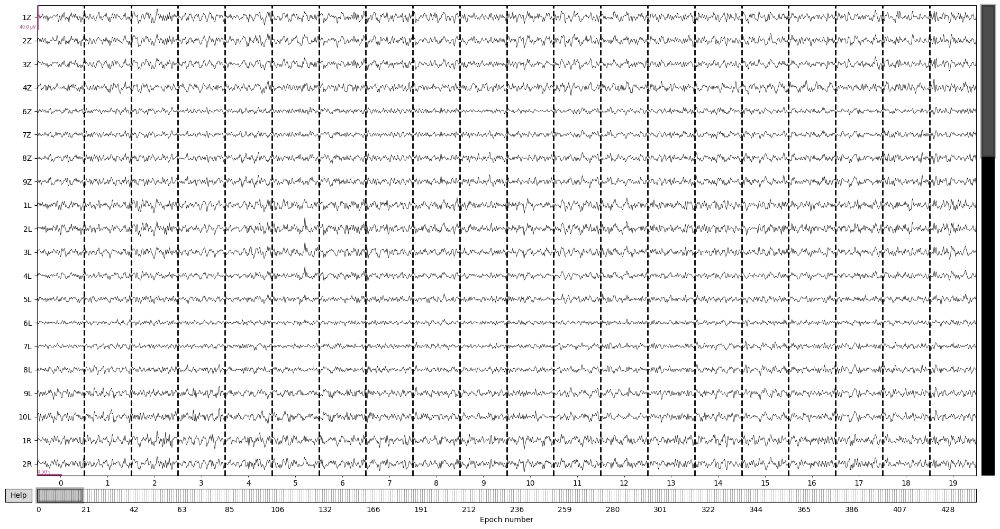

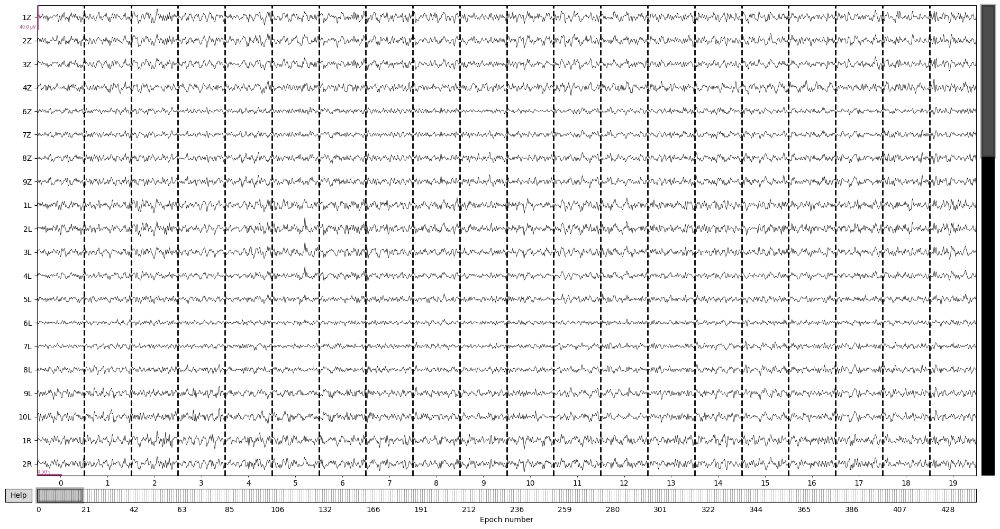

In [85]:
epochs_condition1.plot()

In [76]:
D_average = []
ND_average = []

for pid in valid_pids:
    eng_D_epochs = engagement_index_D.get(pid)
    eng_ND_epochs = engagement_index_ND.get(pid)

    mean_d = np.mean(eng_D_epochs, axis =0)
    mean_nd = np.mean(eng_ND_epochs, axis =0)

    D_average.append(mean_d)
    ND_average.append(mean_nd)


D_average = np.array(D_average)   
ND_average = np.array(ND_average)   
    

In [77]:
# Initialize a list to hold p-values
p_values = []

# Perform Wilcoxon test for each channel across participants
for ch in range(D_average.shape[1]):
    stat, p_value = wilcoxon(D_average[:, ch], ND_average[:, ch])
    p_values.append(p_value)

# Convert list to numpy array
p_values = np.array(p_values)

# Apply multiple comparisons correction using Benjamini-Hochberg method
p_values_corrected = multipletests(p_values, alpha=0.05, method='fdr_bh')[1]

# Display the original and corrected p-values
p_values_corrected

array([0.25802003, 0.3146823 , 0.32541432, 0.32917491, 0.59160199,
       0.66336299, 0.5451046 , 0.45837927, 0.45837927, 0.25802003,
       0.32917491, 0.58555695, 0.59160199, 0.96644723, 0.32917491,
       0.32917491, 0.32541432, 0.32541432, 0.25802003, 0.32917491,
       0.32917491, 0.32541432, 0.65715615, 0.84198925, 0.96644723,
       0.95437261, 0.55320294, 0.84198925, 0.35425317, 0.49664424,
       0.96644723, 0.55320294, 0.5451046 , 0.38050936, 0.64743644,
       0.32917491, 0.92266344, 0.32917491, 0.96160943, 0.49664424,
       0.25802003, 0.69607657, 0.52821653, 0.66336299, 0.32917491,
       0.32917491, 0.59160199, 0.66336299, 0.84198925, 0.25802003,
       0.55320294, 0.32917491, 0.55320294, 0.32541432, 0.32541432,
       0.32917491, 0.3146823 , 0.55320294, 0.25802003, 0.25802003,
       0.96644723, 0.55320294])

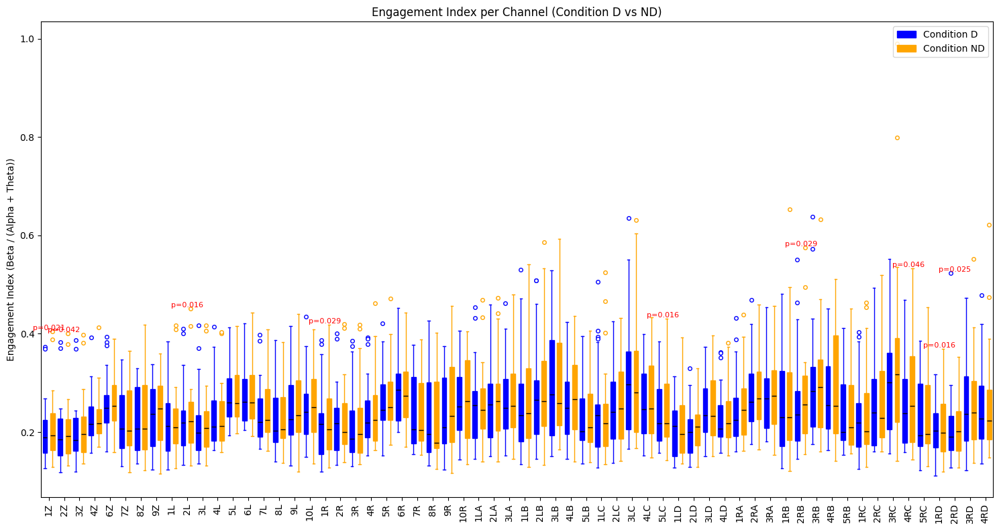

In [79]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import wilcoxon
import matplotlib.patches as mpatches

# Function to plot boxplots and perform Wilcoxon test with corrected p-values
def plot_boxplot_and_wilcoxon(engagement_index_D, engagement_index_ND, channels, p_values_corrected):
    n_channels = engagement_index_D.shape[1]
    fig, ax = plt.subplots(figsize=(15, 8))

    # Define colors for each condition
    colors = {'D': 'blue', 'ND': 'orange'}

    # Create custom patches for the legend
    patch_D = mpatches.Patch(color=colors['D'], label='Condition D')
    patch_ND = mpatches.Patch(color=colors['ND'], label='Condition ND')

    # Boxplot for each channel
    for i in range(n_channels):
        data = [engagement_index_D[:, i], engagement_index_ND[:, i]]
        
        # Boxplots for ND and D conditions with different colors
        box_D = ax.boxplot(data[0], positions=[i*2], widths=0.6, patch_artist=True,
                           boxprops=dict(facecolor=colors['D'], color=colors['D']),
                           medianprops=dict(color='black'),
                           whiskerprops=dict(color=colors['D']),
                           capprops=dict(color=colors['D']),
                           flierprops=dict(marker='o', markeredgecolor='blue', markersize=4, markerfacecolor='white')) 
        
        box_ND = ax.boxplot(data[1], positions=[i*2+1], widths=0.6, patch_artist=True,
                            boxprops=dict(facecolor=colors['ND'], color=colors['ND']),
                            medianprops=dict(color='black'),
                            whiskerprops=dict(color=colors['ND']),
                            capprops=dict(color=colors['ND']),
                            flierprops=dict(marker='o', markeredgecolor='orange', markersize=4, markerfacecolor='white')) 

        # Display p-value if it is statistically significant
        if p_values_corrected[i] < 0.05:
            # Add the p-value as text above the boxplot
            max_y = max(np.max(data[0]), np.max(data[1]))  # Get the max y value to place the text
            ax.text(i*2+0.5, max_y, f'p={p_values_corrected[i]:.3f}', ha='center', va='bottom', fontsize=8, color='red')
    
    # Set tick labels and formatting
    ax.set_xticks(np.arange(0, n_channels * 2, 2) + 0.5)
    ax.set_xticklabels(channels, rotation=90)
    ax.set_ylabel('Engagement Index (Beta / (Alpha + Theta))')
    ax.set_title('Engagement Index per Channel (Condition D vs ND)')

    # Add legend for conditions
    ax.legend(handles=[patch_D, patch_ND], loc='upper right')

    # Display the plot
    plt.tight_layout()
    plt.show()

# Assuming you have `engagement_D_mean`, `engagement_ND_mean`, `channels`, and `p_values_corrected` from previous steps:
plot_boxplot_and_wilcoxon(D_average, ND_average, channels, p_values)


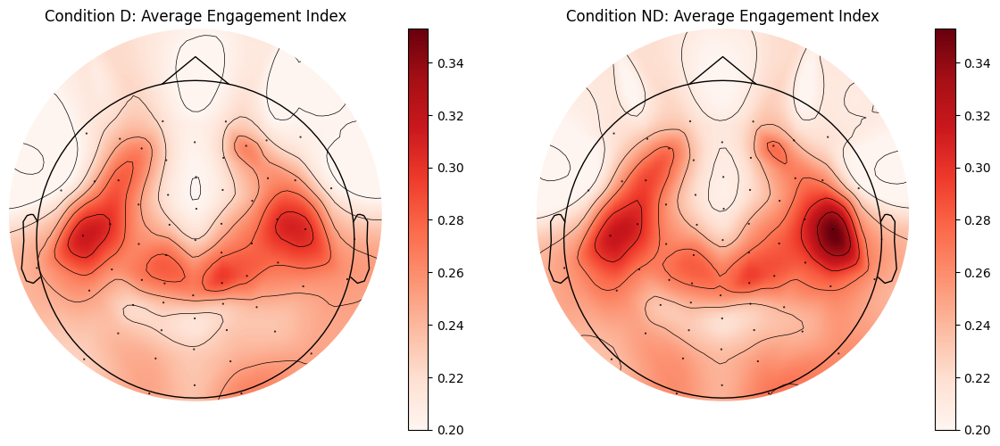

In [82]:

ND_average_average = np.mean(ND_average, axis =0)
D_average_average = np.mean(D_average, axis =0)

# Calculate global vmin and vmax for both conditions
vmin = min(np.min(D_average_average), np.min(ND_average_average))
vmax = max(np.max(D_average_average), np.max(ND_average_average))


# Plot Topoplots for both conditions side by side with colorbars and global vlim
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  # Create subplots with 1 row and 2 columns

# Topoplot for Condition D
im, _ = mne.viz.plot_topomap(D_average_average, info, axes=axes[0], show=False, sphere=(0.00, -0.02, 0.00, 0.13),
                             sensors= True,
                             vlim=(vmin,vmax))  # Apply global vlim
axes[0].set_title('Condition D: Average Engagement Index')

# Add colorbar for Condition D
fig.colorbar(im, ax=axes[0])

# Topoplot for Condition ND
im, _ = mne.viz.plot_topomap(ND_average_average, info, axes=axes[1], show=False, sphere=(0.00, -0.02, 0.00, 0.13),
                             sensors= True,
                             vlim=(vmin,vmax))  # Apply global vlim
axes[1].set_title('Condition ND: Average Engagement Index')

# Add colorbar for Condition ND
fig.colorbar(im, ax=axes[1])

# Adjust layout
plt.tight_layout()
plt.show()


Significant channels for all participants saved to engagement_index_significant_channels_participants.csv
Total Participants with Results: 24
Feature matrix shape: (24, 62)
Feature matrix:
[[0 0 0 ... 1 1 1]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 1 0 0]
 [0 0 1 ... 1 0 0]
 [1 1 0 ... 0 1 1]]
Distance matrix shape: (24, 24)
Distance matrix is clean.
For n_clusters = 2, the average silhouette_score is : 0.1969
For n_clusters = 3, the average silhouette_score is : 0.1846
For n_clusters = 4, the average silhouette_score is : 0.1441
For n_clusters = 5, the average silhouette_score is : 0.1332
For n_clusters = 6, the average silhouette_score is : 0.1267
For n_clusters = 7, the average silhouette_score is : 0.1258
For n_clusters = 8, the average silhouette_score is : 0.1282
For n_clusters = 9, the average silhouette_score is : 0.1176
Optimal number of clusters determined to be: 2
Results with cluster labels saved to engagement_index_significant_channels_participants_with_clust

c:\Users\erangad\AppData\Local\anaconda3\envs\eeg\lib\site-packages\sklearn\metrics\pairwise.py:2361: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


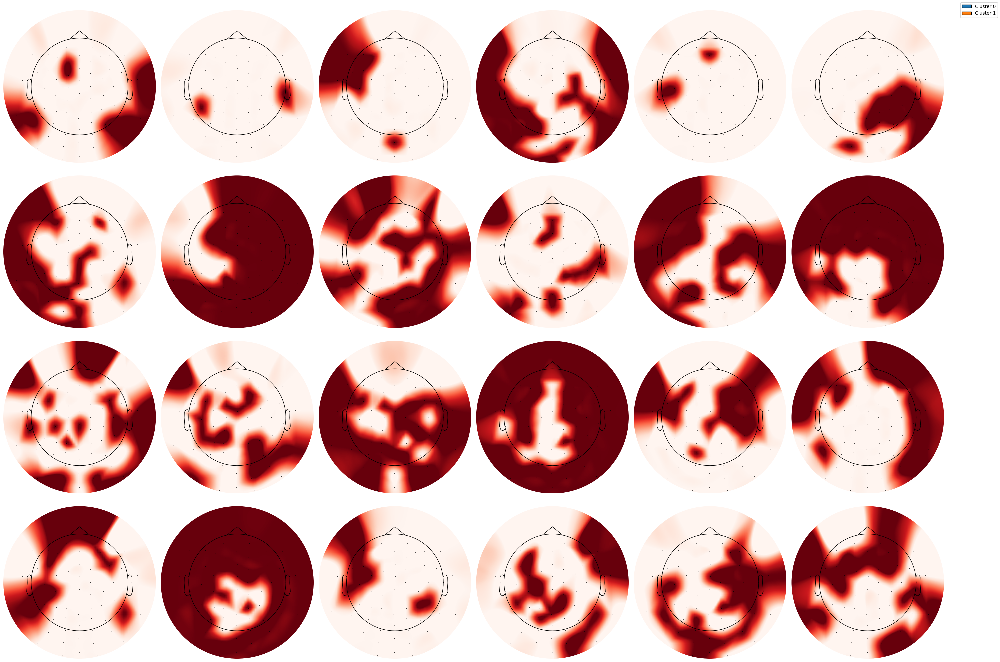

Topographical maps of all participants grouped by clusters saved to 'significant_channels_participants_clusters_topomaps.png'


In [8]:
import numpy as np
import pandas as pd
from scipy.stats import ttest_rel
from statsmodels.stats.multitest import multipletests
import mne
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import pairwise_distances, silhouette_score
from matplotlib.patches import Patch


# Create DataFrame and save to CSV
df_results = pd.DataFrame(results)
csv_filename = 'engagement_index_significant_channels_participants.csv'
df_results.to_csv(csv_filename, index=False)

print(f"Significant channels for all participants saved to {csv_filename}")
print(f"Total Participants with Results: {len(df_results)}")


# Prepare data for clustering
# Create a binary feature matrix where each row represents a participant and each column represents a channel
# Value is 1 if the channel is significant for the participant, else 0
feature_matrix = []
participant_ids = []

all_channels = epochs_condition1_matched.info['ch_names']

for idx, row in df_results.iterrows():
    participant_id = row['Participant_ID']
    sig_channels = row['Significant_Channels'].split(', ') if row['Significant_Channels'] else []
    feature_vector = [1 if ch in sig_channels else 0 for ch in all_channels]
    feature_matrix.append(feature_vector)
    participant_ids.append(participant_id)

feature_matrix = np.array(feature_matrix)

# Debugging: Print the shape and contents of feature_matrix
print(f"Feature matrix shape: {feature_matrix.shape}")  # Expected: (24, 62)
print(f"Feature matrix:\n{feature_matrix}")

# Compute the Jaccard distance matrix
dist_matrix = pairwise_distances(feature_matrix, metric='jaccard')

# Verify the shape of the distance matrix
print(f"Distance matrix shape: {dist_matrix.shape}")  # Should be (24, 24)

# Ensure that the distance matrix is square
if dist_matrix.shape[0] != dist_matrix.shape[1]:
    raise ValueError(f"Distance matrix should be square, got matrix of shape {dist_matrix.shape}")

# Check for NaNs or Infs in the distance matrix
if np.isnan(dist_matrix).any() or np.isinf(dist_matrix).any():
    raise ValueError("Distance matrix contains NaN or Inf values. Please check the data.")
else:
    print("Distance matrix is clean.")

# Determine the optimal number of clusters using the Silhouette Score
range_n_clusters = range(2, min(10, len(valid_pids)))  # Adjust max clusters based on number of participants
best_n_clusters = 2
best_score = -1

for n_clusters in range_n_clusters:
    clustering = AgglomerativeClustering(n_clusters=n_clusters, metric='precomputed', linkage='average')
    cluster_labels = clustering.fit_predict(dist_matrix)
    silhouette_avg = silhouette_score(dist_matrix, cluster_labels, metric='precomputed')
    print(f"For n_clusters = {n_clusters}, the average silhouette_score is : {silhouette_avg:.4f}")
    if silhouette_avg > best_score:
        best_score = silhouette_avg
        best_n_clusters = n_clusters

print(f"Optimal number of clusters determined to be: {best_n_clusters}")

# Perform clustering with the optimal number of clusters
clustering = AgglomerativeClustering(n_clusters=best_n_clusters, metric='precomputed', linkage='average')
cluster_labels = clustering.fit_predict(dist_matrix)

# Add cluster labels to the results DataFrame
df_results['Cluster'] = cluster_labels

# Save updated results with cluster labels
csv_cluster_filename = 'engagement_index_significant_channels_participants_with_clusters.csv'
df_results.to_csv(csv_cluster_filename, index=False)
print(f"Results with cluster labels saved to {csv_cluster_filename}")

# Visualization: Plot topomaps grouped by clusters
# Define the number of rows and columns for subplots
num_participants = len(df_results)
num_rows = 4
num_cols = int(np.ceil(num_participants / num_rows))

# Create a color map for clusters
unique_clusters = np.unique(cluster_labels)
cmap = plt.get_cmap('tab10')  # Use tab10 colormap for up to 10 clusters
cluster_colors = {cluster: cmap(i) for i, cluster in enumerate(unique_clusters)}

# Create a figure with subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows))
axes = axes.flatten()  # Flatten in case of multiple rows and columns

# Iterate through each participant and plot the topomap
for idx, row in df_results.iterrows():
    participant_id = row['Participant_ID']
    sig_channels = row['Significant_Channels'].split(', ') if row['Significant_Channels'] else []
    cluster = row['Cluster']
    
    ax = axes[idx]
    
    # Create data for topomap: 1 for significant, 0 otherwise
    sig_data = np.zeros(len(all_channels))
    for ch in sig_channels:
        if ch in all_channels:
            ch_idx = all_channels.index(ch)
            sig_data[ch_idx] = 1  # Mark significant channels
    
    # Create an Evoked object (required for plotting)
    evoked = mne.EvokedArray(sig_data[:, np.newaxis], epochs_condition1_matched.info)
    
    # Plot topomap without 'show_names' and 'names', set color based on cluster
    mne.viz.plot_topomap(
        sig_data,
        evoked.info,
        axes=ax,
        show=False,
        cmap='Reds',
        vlim= (0,1),
        sensors=True,
        outlines='head',
        contours= 0
    )
    
    # Optionally, add a colored border to indicate cluster
    for spine in ax.spines.values():
        spine.set_edgecolor(cluster_colors[cluster])
        spine.set_linewidth(2)
    
    # Remove axis ticks for clarity
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')

# Remove any unused subplots
for j in range(num_participants, len(axes)):
    fig.delaxes(axes[j])

# Create a legend for clusters
legend_elements = [Patch(facecolor=cluster_colors[cluster], edgecolor='k', label=f'Cluster {cluster}') for cluster in unique_clusters]
fig.legend(handles=legend_elements, loc='upper right')

plt.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust layout to accommodate legend
plt.show()

# Save the figure
fig.savefig('significant_channels_participants_clusters_topomaps.png', dpi=300)
print("Topographical maps of all participants grouped by clusters saved to 'significant_channels_participants_clusters_topomaps.png'")


Significant channels for all participants saved to engagement_index_significant_channels_participants.csv
Total Participants with Results: 24
Feature matrix shape: (24, 62)
Feature matrix:
[[0 0 0 ... 1 1 1]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 1 0 0]
 [0 0 1 ... 1 0 0]
 [1 1 0 ... 0 1 1]]
Distance matrix shape: (24, 24)
Distance matrix is clean.
For n_clusters = 2, the average silhouette_score is : 0.1969
For n_clusters = 3, the average silhouette_score is : 0.1846
For n_clusters = 4, the average silhouette_score is : 0.1441
For n_clusters = 5, the average silhouette_score is : 0.1332
For n_clusters = 6, the average silhouette_score is : 0.1267
For n_clusters = 7, the average silhouette_score is : 0.1258
For n_clusters = 8, the average silhouette_score is : 0.1282
For n_clusters = 9, the average silhouette_score is : 0.1176
Optimal number of clusters determined to be: 2
Results with cluster labels saved to engagement_index_significant_channels_participants_with_clust

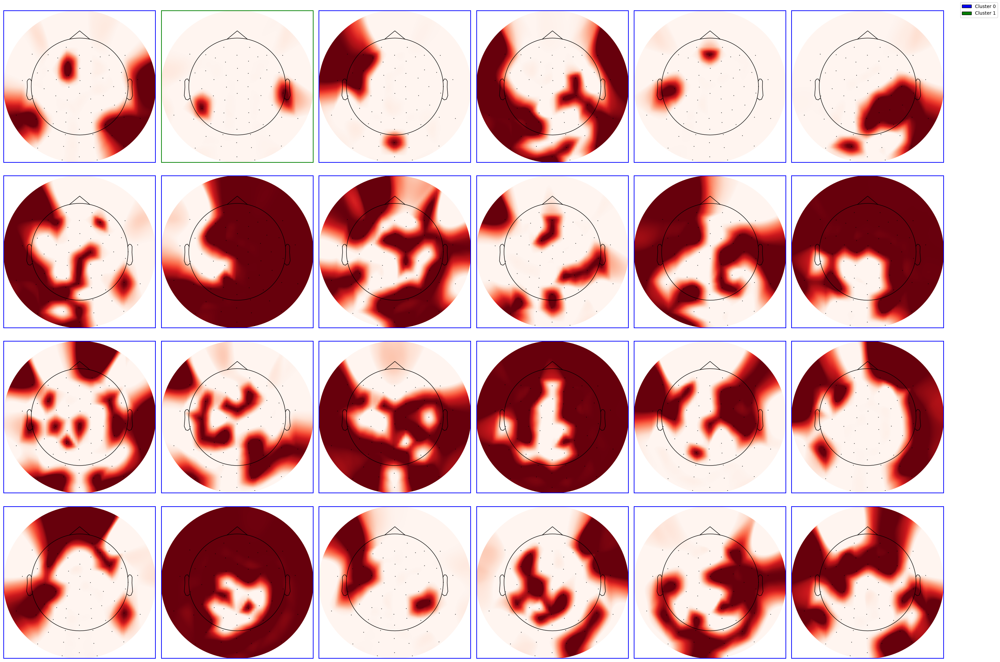

Topographical maps of all participants grouped by clusters saved to 'significant_channels_participants_clusters_topomaps.png'


In [11]:
import numpy as np
import pandas as pd
from scipy.stats import ttest_rel
from statsmodels.stats.multitest import multipletests
import mne
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import pairwise_distances, silhouette_score
from matplotlib.patches import Patch, Rectangle


# Create DataFrame and save to CSV
df_results = pd.DataFrame(results)
csv_filename = 'engagement_index_significant_channels_participants.csv'
df_results.to_csv(csv_filename, index=False)

print(f"Significant channels for all participants saved to {csv_filename}")
print(f"Total Participants with Results: {len(df_results)}")


# Prepare data for clustering
# Create a binary feature matrix where each row represents a participant and each column represents a channel
# Value is 1 if the channel is significant for the participant, else 0
feature_matrix = []
participant_ids = []

all_channels = epochs_condition1_matched.info['ch_names']

for idx, row in df_results.iterrows():
    participant_id = row['Participant_ID']
    sig_channels = row['Significant_Channels'].split(', ') if row['Significant_Channels'] else []
    feature_vector = [1 if ch in sig_channels else 0 for ch in all_channels]
    feature_matrix.append(feature_vector)
    participant_ids.append(participant_id)

feature_matrix = np.array(feature_matrix)

# Debugging: Print the shape and contents of feature_matrix
print(f"Feature matrix shape: {feature_matrix.shape}")  # Expected: (24, 62)
print(f"Feature matrix:\n{feature_matrix}")

# Convert feature_matrix to boolean to avoid DataConversionWarning
feature_matrix_bool = feature_matrix.astype(bool)

# Compute the Jaccard distance matrix
dist_matrix = pairwise_distances(feature_matrix_bool, metric='jaccard')

# Verify the shape of the distance matrix
print(f"Distance matrix shape: {dist_matrix.shape}")  # Should be (24, 24)

# Ensure that the distance matrix is square
if dist_matrix.shape[0] != dist_matrix.shape[1]:
    raise ValueError(f"Distance matrix should be square, got matrix of shape {dist_matrix.shape}")

# Check for NaNs or Infs in the distance matrix
if np.isnan(dist_matrix).any() or np.isinf(dist_matrix).any():
    raise ValueError("Distance matrix contains NaN or Inf values. Please check the data.")
else:
    print("Distance matrix is clean.")

# Determine the optimal number of clusters using the Silhouette Score
range_n_clusters = range(2, min(10, len(valid_pids)))  # Adjust max clusters based on number of participants
best_n_clusters = 2
best_score = -1

for n_clusters in range_n_clusters:
    clustering = AgglomerativeClustering(n_clusters=n_clusters, metric='precomputed', linkage='average')
    cluster_labels = clustering.fit_predict(dist_matrix)
    silhouette_avg = silhouette_score(dist_matrix, cluster_labels, metric='precomputed')
    print(f"For n_clusters = {n_clusters}, the average silhouette_score is : {silhouette_avg:.4f}")
    if silhouette_avg > best_score:
        best_score = silhouette_avg
        best_n_clusters = n_clusters

print(f"Optimal number of clusters determined to be: {best_n_clusters}")

# Perform clustering with the optimal number of clusters
clustering = AgglomerativeClustering(n_clusters=best_n_clusters, metric='precomputed', linkage='average')
cluster_labels = clustering.fit_predict(dist_matrix)

# Add cluster labels to the results DataFrame
df_results['Cluster'] = cluster_labels

# Save updated results with cluster labels
csv_cluster_filename = 'engagement_index_significant_channels_participants_with_clusters.csv'
df_results.to_csv(csv_cluster_filename, index=False)
print(f"Results with cluster labels saved to {csv_cluster_filename}")

# Define specific colors for each cluster
cluster_colors = {
    0: 'blue',    # Cluster 0
    1: 'green'    # Cluster 1
}

# Visualization: Plot topomaps grouped by clusters
# Define the number of rows and columns for subplots
num_participants = len(df_results)
num_rows = 4
num_cols = int(np.ceil(num_participants / num_rows))

# Create a figure with subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows))
axes = axes.flatten()  # Flatten in case of multiple rows and columns

# Iterate through each participant and plot the topomap
for idx, row in df_results.iterrows():
    participant_id = row['Participant_ID']
    sig_channels = row['Significant_Channels'].split(', ') if row['Significant_Channels'] else []
    cluster = row['Cluster']
    
    ax = axes[idx]
    
    # Create data for topomap: 1 for significant, 0 otherwise
    sig_data = np.zeros(len(all_channels))
    for ch in sig_channels:
        if ch in all_channels:
            ch_idx = all_channels.index(ch)
            sig_data[ch_idx] = 1  # Mark significant channels
    
    # Create an Evoked object (required for plotting)
    evoked = mne.EvokedArray(sig_data[:, np.newaxis], epochs_condition1_matched.info)
    
    # Plot topomap without 'show_names' and 'names', set color based on significant channels
    mne.viz.plot_topomap(
        sig_data,
        evoked.info,
        axes=ax,
        show=False,
        cmap='Reds',
        vlim =(0,1),
        sensors=True,
        outlines='head',
        contours=0,
    )
    
    # Add a rectangle patch to indicate cluster membership
    rect = Rectangle((0, 0), 1, 1, transform=ax.transAxes, 
                     fill=False, edgecolor=cluster_colors[cluster], linewidth=3)
    ax.add_patch(rect)
    
    # Remove axis ticks for clarity
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')

# Remove any unused subplots
for j in range(num_participants, len(axes)):
    fig.delaxes(axes[j])

# Create a legend for clusters
legend_elements = [
    Patch(facecolor=cluster_colors[cluster], edgecolor='k', label=f'Cluster {cluster}') 
    for cluster in sorted(cluster_colors.keys())
]
fig.legend(handles=legend_elements, loc='upper right')

plt.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust layout to accommodate legend
plt.show()

# Save the figure
fig.savefig('significant_channels_participants_clusters_topomaps.png', dpi=300)
print("Topographical maps of all participants grouped by clusters saved to 'significant_channels_participants_clusters_topomaps.png'")


Significant channels for all participants saved to engagement_index_significant_channels_participants.csv
Total Participants with Results: 24
Feature matrix shape: (24, 62)
Feature matrix:
[[0 0 0 ... 1 1 1]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 1 0 0]
 [0 0 1 ... 1 0 0]
 [1 1 0 ... 0 1 1]]
Distance matrix shape: (24, 24)
Distance matrix is clean.
For n_clusters = 2, the average silhouette_score is : 0.1969
For n_clusters = 3, the average silhouette_score is : 0.1846
For n_clusters = 4, the average silhouette_score is : 0.1441
For n_clusters = 5, the average silhouette_score is : 0.1332
For n_clusters = 6, the average silhouette_score is : 0.1267
For n_clusters = 7, the average silhouette_score is : 0.1258
For n_clusters = 8, the average silhouette_score is : 0.1282
For n_clusters = 9, the average silhouette_score is : 0.1176
Optimal number of clusters determined to be: 2
Results with cluster labels saved to engagement_index_significant_channels_participants_with_clust

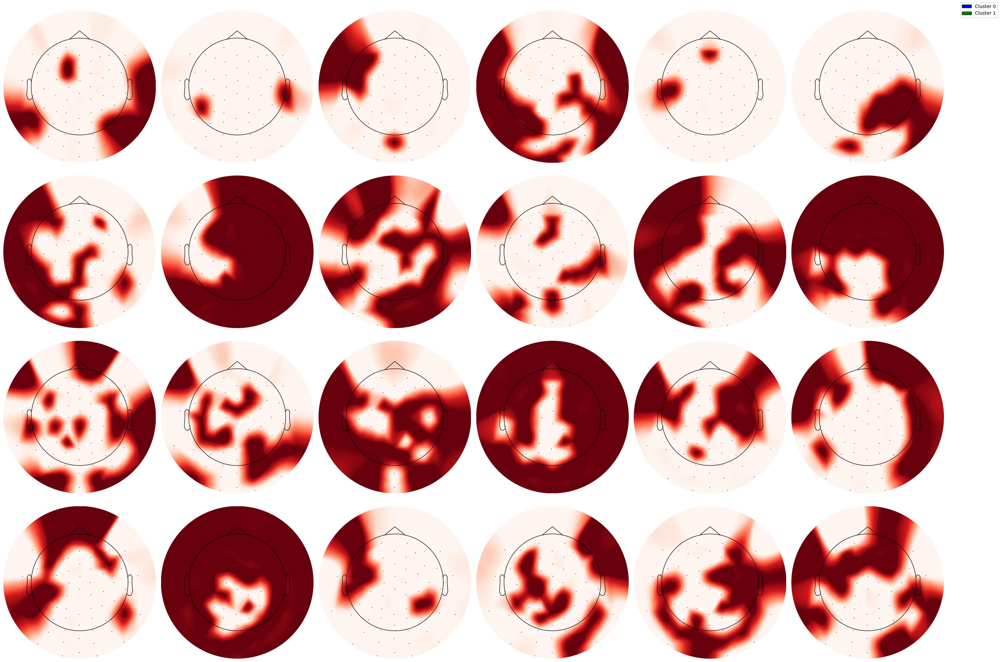

Topographical maps of all participants grouped by clusters saved to 'significant_channels_participants_clusters_topomaps.png'


In [10]:
import numpy as np
import pandas as pd
from scipy.stats import ttest_rel
from statsmodels.stats.multitest import multipletests
import mne
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import pairwise_distances, silhouette_score
from matplotlib.patches import Patch


# Create DataFrame and save to CSV
df_results = pd.DataFrame(results)
csv_filename = 'engagement_index_significant_channels_participants.csv'
df_results.to_csv(csv_filename, index=False)

print(f"Significant channels for all participants saved to {csv_filename}")
print(f"Total Participants with Results: {len(df_results)}")


# Prepare data for clustering
# Create a binary feature matrix where each row represents a participant and each column represents a channel
# Value is 1 if the channel is significant for the participant, else 0
feature_matrix = []
participant_ids = []

all_channels = epochs_condition1_matched.info['ch_names']

for idx, row in df_results.iterrows():
    participant_id = row['Participant_ID']
    sig_channels = row['Significant_Channels'].split(', ') if row['Significant_Channels'] else []
    feature_vector = [1 if ch in sig_channels else 0 for ch in all_channels]
    feature_matrix.append(feature_vector)
    participant_ids.append(participant_id)

feature_matrix = np.array(feature_matrix)

# Debugging: Print the shape and contents of feature_matrix
print(f"Feature matrix shape: {feature_matrix.shape}")  # Expected: (24, 62)
print(f"Feature matrix:\n{feature_matrix}")

# Convert feature_matrix to boolean to avoid DataConversionWarning
feature_matrix_bool = feature_matrix.astype(bool)

# Compute the Jaccard distance matrix
dist_matrix = pairwise_distances(feature_matrix_bool, metric='jaccard')

# Verify the shape of the distance matrix
print(f"Distance matrix shape: {dist_matrix.shape}")  # Should be (24, 24)

# Ensure that the distance matrix is square
if dist_matrix.shape[0] != dist_matrix.shape[1]:
    raise ValueError(f"Distance matrix should be square, got matrix of shape {dist_matrix.shape}")

# Check for NaNs or Infs in the distance matrix
if np.isnan(dist_matrix).any() or np.isinf(dist_matrix).any():
    raise ValueError("Distance matrix contains NaN or Inf values. Please check the data.")
else:
    print("Distance matrix is clean.")

# Determine the optimal number of clusters using the Silhouette Score
range_n_clusters = range(2, min(10, len(valid_pids)))  # Adjust max clusters based on number of participants
best_n_clusters = 2
best_score = -1

for n_clusters in range_n_clusters:
    clustering = AgglomerativeClustering(n_clusters=n_clusters, metric='precomputed', linkage='average')
    cluster_labels = clustering.fit_predict(dist_matrix)
    silhouette_avg = silhouette_score(dist_matrix, cluster_labels, metric='precomputed')
    print(f"For n_clusters = {n_clusters}, the average silhouette_score is : {silhouette_avg:.4f}")
    if silhouette_avg > best_score:
        best_score = silhouette_avg
        best_n_clusters = n_clusters

print(f"Optimal number of clusters determined to be: {best_n_clusters}")

# Perform clustering with the optimal number of clusters
clustering = AgglomerativeClustering(n_clusters=best_n_clusters, metric='precomputed', linkage='average')
cluster_labels = clustering.fit_predict(dist_matrix)

# Add cluster labels to the results DataFrame
df_results['Cluster'] = cluster_labels

# Save updated results with cluster labels
csv_cluster_filename = 'engagement_index_significant_channels_participants_with_clusters.csv'
df_results.to_csv(csv_cluster_filename, index=False)
print(f"Results with cluster labels saved to {csv_cluster_filename}")

# Visualization: Plot topomaps grouped by clusters
# Define the number of rows and columns for subplots
num_participants = len(df_results)
num_rows = 4
num_cols = int(np.ceil(num_participants / num_rows))

# Define specific colors for each cluster
cluster_colors = {
    0: 'blue',    # Cluster 0
    1: 'green'    # Cluster 1
}

# Create a figure with subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows))
axes = axes.flatten()  # Flatten in case of multiple rows and columns

# Iterate through each participant and plot the topomap
for idx, row in df_results.iterrows():
    participant_id = row['Participant_ID']
    sig_channels = row['Significant_Channels'].split(', ') if row['Significant_Channels'] else []
    cluster = row['Cluster']
    
    ax = axes[idx]
    
    # Create data for topomap: 1 for significant, 0 otherwise
    sig_data = np.zeros(len(all_channels))
    for ch in sig_channels:
        if ch in all_channels:
            ch_idx = all_channels.index(ch)
            sig_data[ch_idx] = 1  # Mark significant channels
    
    # Create an Evoked object (required for plotting)
    evoked = mne.EvokedArray(sig_data[:, np.newaxis], epochs_condition1_matched.info)
    
    # Plot topomap without 'show_names' and 'names', set color based on significant channels
    mne.viz.plot_topomap(
        sig_data,
        evoked.info,
        axes=ax,
        show=False,
        cmap='Reds',
        vlim= (0,1),
        sensors=True,
        outlines='head',
        contours=0,
    )
    
    # Add a colored border to indicate cluster membership
    for spine in ax.spines.values():
        spine.set_edgecolor(cluster_colors[cluster])
        spine.set_linewidth(3)
    
    # Remove axis ticks for clarity
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')

# Remove any unused subplots
for j in range(num_participants, len(axes)):
    fig.delaxes(axes[j])

# Create a legend for clusters
legend_elements = [
    Patch(facecolor=cluster_colors[cluster], edgecolor='k', label=f'Cluster {cluster}') 
    for cluster in sorted(cluster_colors.keys())
]
fig.legend(handles=legend_elements, loc='upper right')

plt.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust layout to accommodate legend
plt.show()

# Save the figure
fig.savefig('significant_channels_participants_clusters_topomaps.png', dpi=300)
print("Topographical maps of all participants grouped by clusters saved to 'significant_channels_participants_clusters_topomaps.png'")
